#### Benchmarking LMMs
The following notebook contains the code for benchmarking the CVC embedding space against different language models (TCR-BERT and ESM-2). Embeddings of the same sequences were created by each model and visualized using UMAP - colored by the Public/Private label and J Gene Type.

#### Set Environment

In [2]:
cd ..

/home/ubuntu/CVC


In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import os, sys
import pandas as pd
import matplotlib
import torch
from tqdm.auto import tqdm
from transformers import AutoTokenizer, AutoModel, BertTokenizer, BertModel
import numpy as np
from cvc.embbeding_wrapper import EmbeddingWrapper, GenericModelEmbeddings
from matplotlib.colors import ListedColormap
import seaborn as sns

SRC_DIR = "cvc"
assert os.path.isdir(SRC_DIR), f"Cannot find src dir: {SRC_DIR}"
sys.path.append(SRC_DIR)
from cvc import model_utils
from lab_notebooks.utils import SC_TRANSFORMER, TRANSFORMER, DEVICE, DATA_DIR
MODEL_DIR = os.path.join(SRC_DIR, "models")
sys.path.append(MODEL_DIR)

FILT_EDIT_DIST = True

PLOT_DIR = os.path.join(os.path.dirname(SRC_DIR), "plots/CDR3_data_plots")
if not os.path.isdir(PLOT_DIR):
    os.makedirs(PLOT_DIR)
PLOT_DIR

2023-11-16 11:57:44.988617: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-16 11:57:44.990371: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-16 11:57:45.028365: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-16 11:57:45.618388: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


'plots/CDR3_data_plots'

In [5]:
from cvc import utils as cvc_utils
DEVICE = cvc_utils.get_device(1)

#### Prepare Data

In [6]:
seqs_file_dir = "data/400K_jGene_df_3cols.csv"

# open data file
tcrb_data = pd.read_csv(seqs_file_dir, engine="pyarrow")
tcrb_data.head()

,Sequences,jGeneName,Private_Public_label
0,CSVARVERAYEQYF,TCRBJ02-07,1
1,CAWKRGPGELFF,TCRBJ02-02,1
2,CASSILAGGPLGEQFF,TCRBJ02-01,1
3,CASSLGPTRSSYEQYF,TCRBJ02-07,1
4,CASSLIPSGVQETQYF,TCRBJ02-05,1


In [ ]:
# extract sequences from dataframe for later use
sequences = tcrb_data["Sequences"].tolist()

#### Embedding Creation and Visualization

##### CVC

In [34]:
tcrb_data_full = pd.read_csv("data/400K_jGene_df.csv", engine="pyarrow")

In [ ]:
# extract embeddings
cvc_embeddings = tcrb_data_full.loc[:, "0":"767"].values

cvc_embed_wrap = EmbeddingWrapper(None, DEVICE, tcrb_data, embeddings = cvc_embeddings, batch_size=400, method="mean", layers=[-1], pbar=True, max_len=120) # TODO - oly to check plots

tcrb_embeddings_df = pd.DataFrame(cvc_embed_wrap.embeddings)
# create anndata object
tcrb_embeddings_adata = cvc_embed_wrap.create_anndata()

###### CVC Public / Private

In [ ]:
cvc_embeddings = cvc_embed_wrap.embeddings
cvc_embed_wrap.plot_embedding(
    color_embed='Private_Public_label', # jGeneName',
    color_map=matplotlib.colors.ListedColormap(colors),
    title="UMAP of CVC Sequences",
    legend_size=5,
    # plot_pdf_path=os.path.join(PLOT_DIR, "umap_chain_single_cell.pdf"),
    n_comps=50,
    fname= "400K_cvc_pub_priv.svg"
)

###### CVC J Gene

In [ ]:
cvc_embed_wrap.plot_embedding(
    color_embed='jGeneName',
    color_map=ListedColormap(sns.color_palette("Spectral", 13)),
    title="UMAP of CVC Sequences by J Gene",
    legend_size=5,
    # plot_pdf_path=os.path.join(PLOT_DIR, "umap_chain_single_cell.pdf"),
    n_comps=50,
    fname= "400K_cvc_j_gene.svg"
)

##### TCR-BERT

In [ ]:
# prepare sequences with correct input format (for each sequence, put a space between each amino acid)
sequences_tcrbert = [' '.join(list(seq)) for seq in sequences]

In [ ]:
tcrbert_wrapper = GenericModelEmbeddings("wukevin/tcr-bert-mlm-only", BertTokenizer, BertModel, sequences_df=tcrb_data)
tcrbert_embeddings = tcrbert_wrapper.get_embeddings(sequences_tcrbert)

In [13]:
# export embeddings with labels to csv
tcrbert_embeddings_df = pd.DataFrame(tcrbert_embeddings)
tcrbert_embeddings_df['Private_Public_label'] = tcrb_data['Private_Public_label']
tcrbert_embeddings_df['jGeneName'] = tcrb_data['jGeneName']

tcrbert_embeddings_df.to_csv('data/tcrbert_embeddings_mlm_labeled_PP_J.csv', index=False)

###### TCR-BERT Public / Private

/home/ubuntu/miniconda3/envs/cvc_env/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ubuntu/miniconda3/envs/cvc_env/lib/python3.8/site-packages/umap/distances.py:1053: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/ubuntu/miniconda3/envs/cvc_env/lib/python3.8/site-packages/umap/distances.py:1061: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. Se

Saving figure to 400K_tcrbert_mlm_pub_priv_2.svg


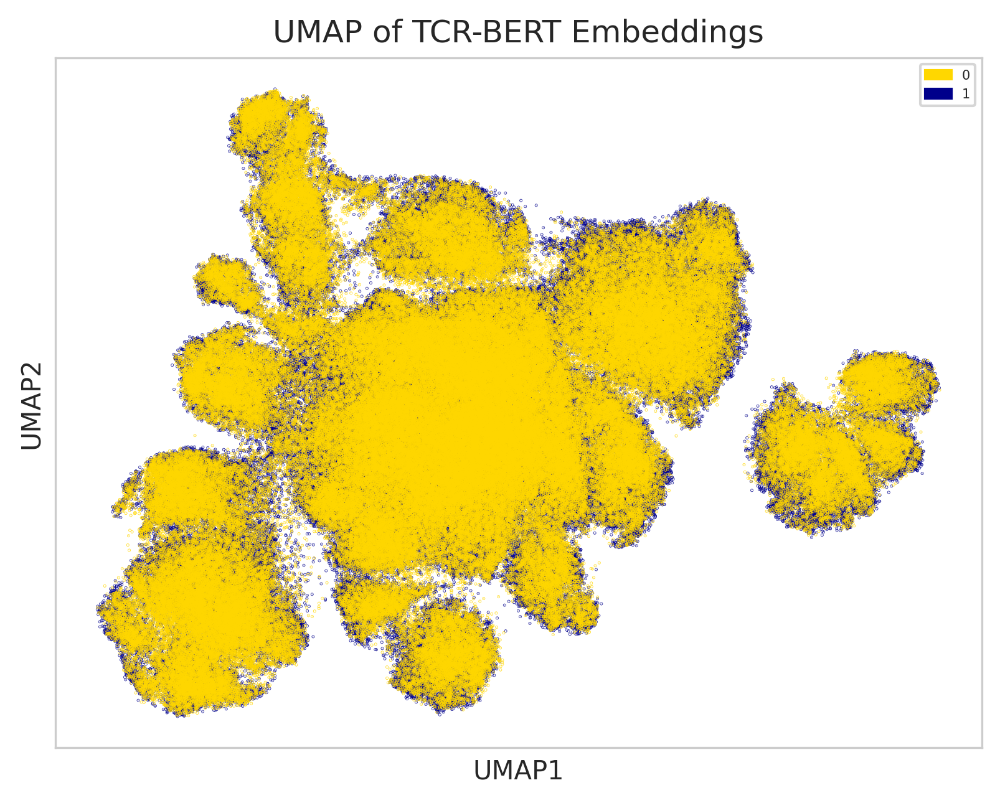

In [15]:
tcrbert_wrapper.plot_embeddings(tcrbert_embeddings, "UMAP of TCR-BERT Embeddings", 'Private_Public_label', '400K_tcrbert_mlm_pub_priv_2.svg')

###### TCR-BERT J Gene

/home/ubuntu/miniconda3/envs/cvc_env/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Saving figure to 400K_tcrbert_mlm_j_gene_2.svg


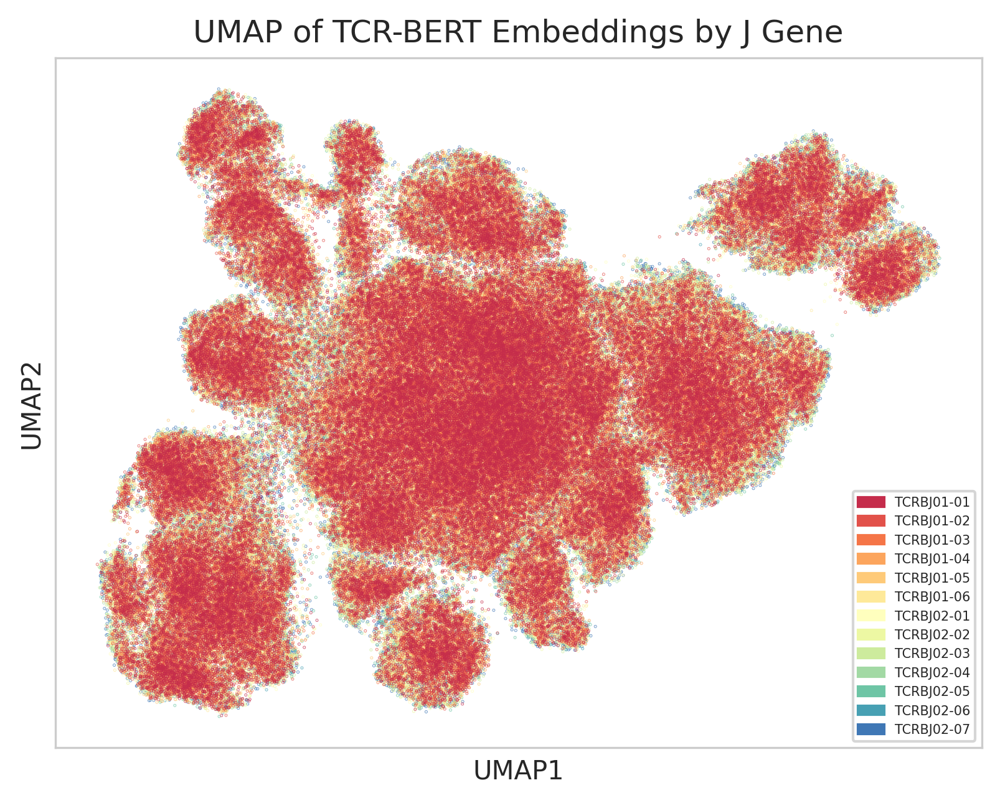

In [16]:
tcrbert_wrapper.plot_embeddings(tcrbert_embeddings, "UMAP of TCR-BERT Embeddings by J Gene", 'jGeneName', '400K_tcrbert_mlm_j_gene_2.svg')

##### ESM-2

In [ ]:
# For ESM2
esm_wrapper = GenericModelEmbeddings("facebook/esm2_t30_150M_UR50D", AutoTokenizer, AutoModel, sequences_df=tcrb_data)
esm_embeddings = esm_wrapper.get_embeddings(sequences)

In [26]:
# export embeddings with labels to csv
esm_embeddings_df = pd.DataFrame(esm_embeddings)
esm_embeddings_df['Private_Public_label'] = tcrb_data['Private_Public_label']
esm_embeddings_df['jGeneName'] = tcrb_data['jGeneName']

esm_embeddings_df.to_csv('data/esm_embeddings_labeled_PP_J.csv', index=False)

###### ESM Public / Private

Some weights of the model checkpoint at facebook/esm2_t30_150M_UR50D were not used when initializing EsmModel: ['lm_head.dense.bias', 'lm_head.bias', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.weight']
- This IS expected if you are initializing EsmModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing EsmModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t30_150M_UR50D and are newly initialized: ['esm.pooler.dense.weight', 'esm.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
100%|███████████████████

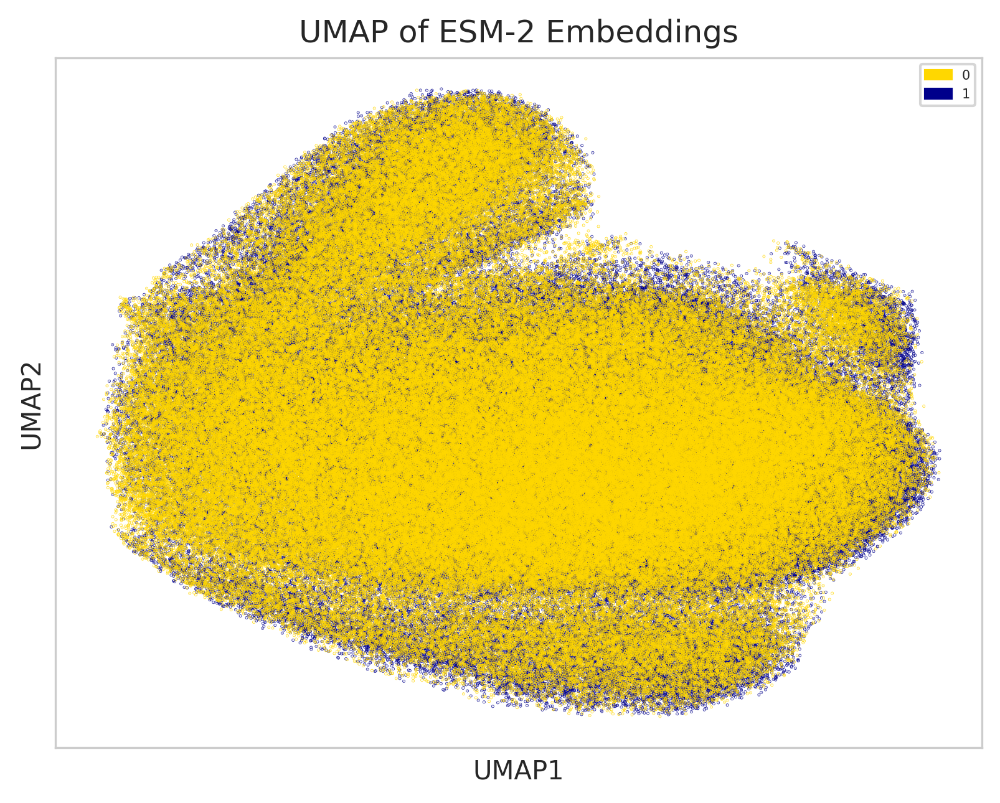

In [54]:
esm_wrapper.plot_embeddings(esm_embeddings, "UMAP of ESM-2 Embeddings", 'Private_Public_label', '400K_esm_pub_priv.svg')

###### ESM J Gene

/home/ubuntu/miniconda3/envs/cvc_env/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ubuntu/CVC/cvc/embbeding_wrapper.py:66: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(fname, bbox_inches="tight", dpi=SAVEFIG_DPI)
/home/ubuntu/miniconda3/envs/cvc_env/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


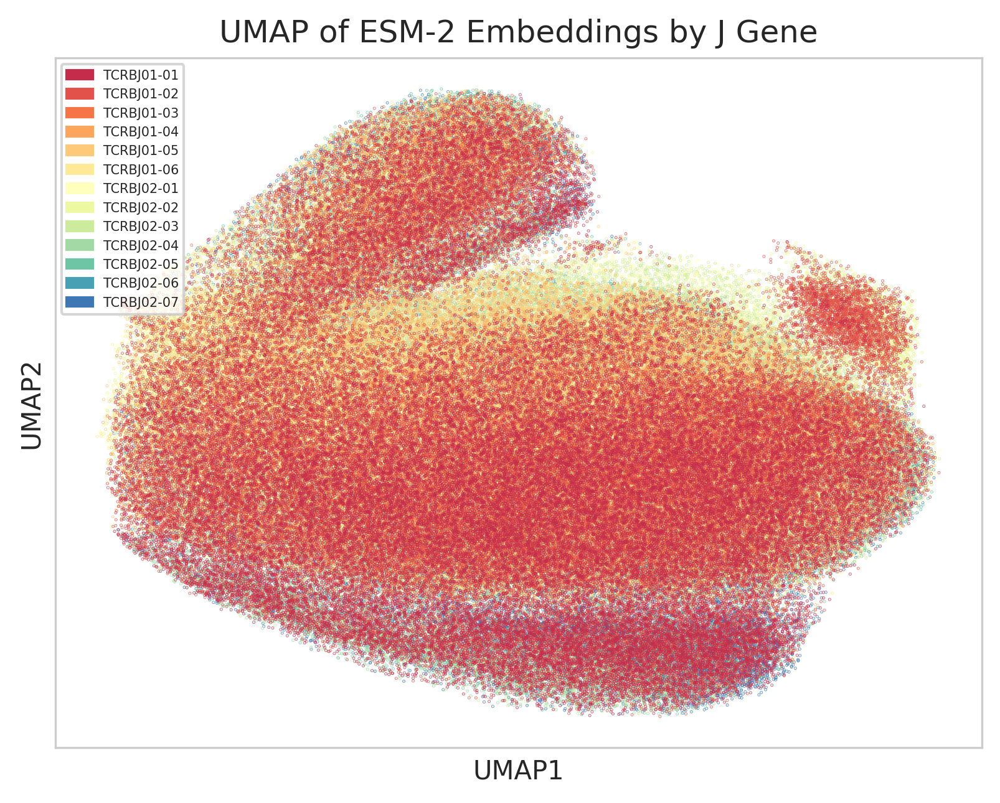

In [55]:
esm_wrapper.plot_embeddings(esm_embeddings, "UMAP of ESM-2 Embeddings by J Gene", 'jGeneName', '400K_esm_j_gene.svg')